### Preprocessing of predictions and determination of interface mutations

In [1]:
import pandas as pd
import matplotlib
import warnings
import os
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import analysis_utils
from copy import deepcopy

# path to repository folder (data is stored here as well)
path = '..'
preds_loc = os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv')

# default plotting settings
font = {'size'   : 18}
matplotlib.rc('font', **font)

# notebook display options
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 300

# load dictionaries to improve formatting of model names
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

# load the predictions and split them into dataframes
db = pd.read_csv(preds_loc).set_index(['uid', 'uid2'])

<Axes: >

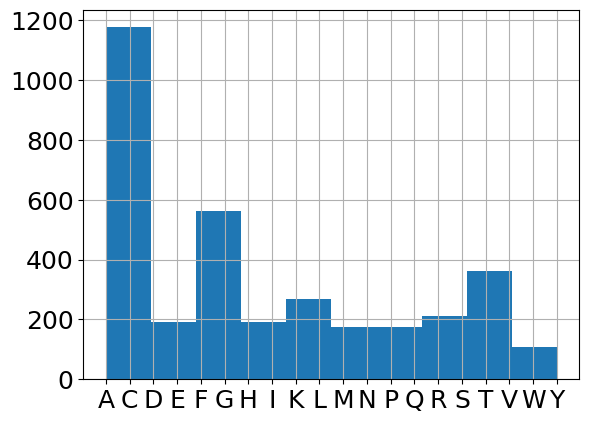

In [2]:
db.sort_values('mutation')['mutation'].hist()

Original unique mutations: 3421
['esmif_monomer_dir', 'msa_1_dir', 'msa_2_dir', 'msa_3_dir', 'msa_4_dir', 'msa_5_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'mutcomputex_dir', 'stability-oracle_dir', 'esm2_3B_dir', 'esm2_15B_half_dir', 'esmif_multimer_dir', 'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'mif_dir', 'mifst_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'esm1v_1_dir', 'esm1v_2_dir', 'esm1v_3_dir', 'esm1v_4_dir', 'esm1v_5_dir', 'esm1v_median_dir', 'esm1v_mean_dir', 'ankh_dir', 'tranception_dir', 'korpm_dir', 'tranception_weights_dir', 'cartesian_ddg_dir']
['K1566_pslm_rfa_1_dir', 'K1566_pslm_rfa_2_dir', 'K1566_pslm_rfa_3_dir', 'K1566_pslm_rfa_4_dir', 'K1566_pslm_rfa_5_dir', 'K1566_pslm_rfa_6_dir', 'K1566_pslm_rfa_7_dir', 'K1566_pslm_rfa_8_dir', 'K1566_pslm_rfa_9_dir', 'K1566_pslm_rfa_10_dir', 'K1566_pslm_rfa_11_dir']
['esmif_monomer_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'mutcomputex_dir', 'stability-oracle_dir', 'esm2_3B_dir', 

,,esmif_monomer_dir,msa_1_dir,msa_2_dir,msa_3_dir,msa_4_dir,msa_5_dir,msa_transformer_median_dir,msa_transformer_mean_dir,mutcomputex_dir,stability-oracle_dir,...,K1566_pslm_rfa_7_dir,K1566_pslm_rfa_8_dir,K1566_pslm_rfa_9_dir,K1566_pslm_rfa_10_dir,K1566_pslm_rfa_11_dir,ddG,cluster,mpnn_rosetta_dir,random_dir,ddG_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_30S,1A23_30S,-0.043712,-9.003407,-8.570910,-8.138058,-7.828304,-8.771099,-8.570910,-8.462356,-0.010359,-0.420,...,-0.631644,-0.635816,-0.635816,-0.635816,-0.593140,-1.80,65,0.509908,-0.748112,-1.80
1A23_32L,1A23_32L,-0.042389,-8.228857,-7.639166,-7.996706,-7.244612,-7.631312,-7.639166,-7.748131,0.383801,0.528,...,0.448606,0.434181,0.434181,0.434181,0.473899,4.95,65,4.100409,-2.253687,4.95
1A23_32S,1A23_32S,-0.029983,-6.820486,-5.639109,-4.841201,-4.271751,-5.161361,-5.161361,-5.346782,-0.003409,-0.170,...,-0.363571,-0.368064,-0.368064,-0.368064,-0.353730,4.40,65,-1.339595,-2.855692,4.40
1A23_32Y,1A23_32Y,-0.020219,-4.798388,-4.519424,-3.944585,-4.510036,-3.452652,-4.510036,-4.245017,0.060203,0.732,...,0.629617,0.623211,0.623211,0.623211,0.661942,4.63,65,1.416091,-1.322837,4.63
1A23_33S,1A23_33S,-0.024960,-8.154238,-6.983203,-7.309464,-6.575727,-7.499977,-7.309464,-7.304522,-0.327936,-1.156,...,-0.839226,-0.846686,-0.846686,-0.846686,-0.815217,-1.10,65,0.489207,-1.199005,-1.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,5CRO_26L,-0.037373,-3.120034,-0.158593,-0.096729,-0.498763,-0.298061,-0.298061,-0.834436,0.002285,0.628,...,0.661812,0.671593,0.671593,0.671593,0.670624,1.10,9,2.534977,-1.122802,1.10
5CRO_26Q,5CRO_26Q,-0.004605,-2.316929,1.459888,1.633560,1.360325,1.471579,1.459888,0.721684,0.013478,0.921,...,0.247456,0.267579,0.267579,0.267579,0.261379,1.40,9,2.969375,0.055380,1.40
5CRO_26V,5CRO_26V,0.037691,-2.944973,1.036326,0.091582,0.751292,0.919195,0.751292,-0.029315,0.043387,0.513,...,0.775492,0.800252,0.800252,0.800252,0.774120,0.90,9,2.064658,-0.517137,0.90


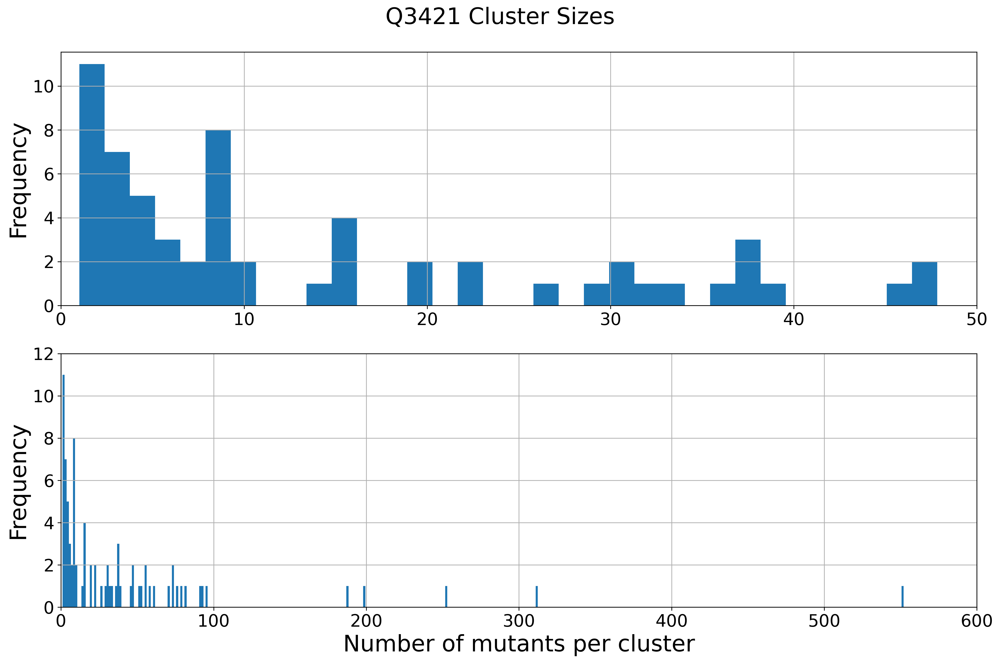

In [3]:
db_class = db

print('Original unique mutations:', len(db_class))

evolutionary = ['tranception', 'msa_transformer', 'esm1v', 'msa', 'esm2', 'ankh']
structural = ['mpnn', 'mif', 'mifst', 'esmif', 'mutcomputex']
supervised = ['MAESTRO', 'ThermoNet', 'INPS', 'PremPS', 'mCSM', 'DUET', 'ACDC', 'I-Mutant3.0', 'SAAFEC', 'MuPro']
untrained = ['DDGun']
potential = ['KORPM', 'PopMusic', 'SDM', 'korpm']
biophysical = ['cartesian_ddg', 'FoldX', 'Evo', 'Cartddg']
transfer = ['stability-oracle']

original_pred_cols = db_class.columns[db_class.columns.str.contains('|'.join(evolutionary + structural + supervised + untrained + potential + biophysical + transfer))]
original_pred_cols = list(original_pred_cols.drop(['reduced_msa_file', 'full_msa_file', 'tranception_dms', 'msa_weights']))#, 'msa_weights']))
original_pred_cols = [c for c in original_pred_cols if not 'runtime' in c]
original_pred_cols = [c for c in original_pred_cols if not 'cluster' in c]
original_pred_cols = [c for c in original_pred_cols if not 'overlaps' in c]
original_pred_cols = [c for c in original_pred_cols if not 'pll' in c]
print(original_pred_cols)

ensemble_cols = [c for c in db_class.columns if 'pslm' in c]
print(ensemble_cols)

db_runtimes = db[[c for c in db.columns if 'runtime' in c]]

original_pred_cols_reduced = deepcopy(original_pred_cols)
for col in [f'esm1v_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
for col in [f'msa_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)

print(original_pred_cols_reduced)

db_class = db_class[original_pred_cols + ensemble_cols + ['ddG', 'cluster']]

#db_class_rescaled = db_class.copy(deep=True)
#db_class_rescaled[original_pred_cols] /= db_class_rescaled[original_pred_cols].std()

db_class['mpnn_rosetta_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']
db_class['random_dir'] = np.random.normal(loc=db['ddG'].mean(), size=len(db_class))
#db_class['korpm_dir'] = db_class['KORPMD_dir']
db_class['ddG_dir'] = db_class['ddG']

#db_class = db_class.drop([c+'_dir' for c in ['ACDCNND', 'FoldXD', 'DDGunD', 'CartddgD']], axis=1) #'PopMsD', 'TNetD'

print(f'Detected {len(db_class.loc[db["on_interface_dir"].astype(bool)])} interface mutations')

fig, axes = plt.subplots(2, figsize=(15, 10), dpi=300) 

db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[0])
axes[0].set_xlim([0, 50]) 
axes[0].tick_params(axis='x', labelsize=18) 
axes[0].set_ylabel('Frequency', fontsize=24)  

# Second plot
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[1])
axes[1].set_xlim([0, 600]) 
axes[1].set_ylim([0, 12])  
axes[1].set_xlabel('Number of mutants per cluster', fontsize=24) 
axes[1].set_ylabel('Frequency', fontsize=24)
axes[1].tick_params(axis='x', labelsize=18)

plt.suptitle('Q3421 Cluster Sizes', fontsize=24)
plt.tight_layout()

db_class

db_class

In [4]:
# Clusters with >= or < 50 unique mutants
print((db_class.groupby('cluster').count().iloc[:, 0] >= 50).sum(), (db_class.groupby('cluster').count().iloc[:, 0] < 50).sum())

20 61


### Non-bootstrapped Analysis of Q3421 (not in text)

In [5]:
# TABLE 1
# Note: due to changes in the dependencies and small changes to preprocessing,
# results have changed very slightly from the current revision, but do not affect
# the interpretation of results or conclusions

# could replace stats=() with ('n', 'MCC', 'auprc', 'ndcg', 'spearman')
# but then you would not be saving the other stats. 
# uncomment to_csv lines to save to a custom location
#db_class['code'] = db_class.index.str[:4]
summ = analysis_utils.compute_stats(db_class[original_pred_cols_reduced + ensemble_cols + ['cluster', 'ddG', 'mpnn_rosetta_dir']], 
                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'tp', 'recall@k1.0', 'aumsc', 'auppc'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=0)
rcv = summ.copy(deep=True)
summ.to_csv('../data/extended/q3421_extended.csv')
tmp1 = summ #.loc[:,['n', 'MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp1.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'n', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ', 'mean_t1s', 'Net Stabilization', 'pred_positives', 
 'mean_stabilization', 'True Positives', 'Sensitivity', 'MRR', 'recall@k1.0']]#, 'Accuracy']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta CartDDG', 'ProteinMPNN mean', 'ProteinMPNN 0.3', 'ProteinMPNN 0.2', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'Ankh', 
    'ESM-2 3B', 'ESM-2 15B', 'Structural', 'Evolutionary', 'Supervised', 'ESM-2 150M', 'ESM-2 650M', 'Ensemble', 'ESM-2 mean', 'ESM-IF mean', 
    'MIF_mean', 'Clustered Ensemble', 'Ensemble_2', 'ProteinMPNN 0.1', 'MIF-ST', 'KORPM', 'MSA-T mean', 'MSA-T 1', 'Tranception', 'Tranception reweighted', 'ESM-1V mean', 
    'ESM-1V 2', 'Gaussian noise', 'ΔΔG label', 'ΔTm label', 'Rosetta/ProtMPNN', 'Stability Oracle', 'MutComputeX',
    'Ensemble 5 Feats', 'Ensemble 6 Feats', 'Ensemble 7 Feats'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp

# < 2 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

n    MCC  AUPRC      ρ  wNDCG  \
measurement model_type   model                                                  
ΔΔG         structural   Rosetta/ProtMPNN  3421.0  0.344  0.530  0.620  0.691   
            ensemble     Ensemble 7 Feats  3421.0  0.306  0.480  0.596  0.670   
                         Ensemble 5 Feats  3421.0  0.305  0.480  0.596  0.667   
                         Ensemble 6 Feats  3421.0  0.307  0.480  0.596  0.666   
            transfer     Stability Oracle  3401.0  0.350  0.491  0.583  0.704   
            biophysical  Rosetta CartDDG   3421.0  0.330  0.473  0.563  0.666   
            structural   ProteinMPNN 0.2   3421.0  0.288  0.460  0.488  0.670   
                         ProteinMPNN 0.3   3421.0  0.286  0.454  0.479  0.673   
                         ProteinMPNN 0.1   3421.0  0.298  0.461  0.480  0.677   
                         ESM-IF            3418.0  0.241  0.430  0.452  0.648   
                         MIF               3421.0  0.266  0.437  0.480  0.655   
                         ESM-IF(M)         3421.0  0.228  0.414  0.426  0.637   
            potential    KORPM             3421.0  0.257  0.400  0.471  0.634   
            structural   MIF-ST            3421.0  0.216  0.381  0.402  0.609   
            evolutionary ESM-2 650M        3421.0  0.198  0.362  0.291  0.604   
            structural   MutComputeX       3409.0  0.214  0.402  0.365  0.625   
            evolutionary Ankh              3421.0  0.171  0.344  0.317  0.606   
                         ESM-2 3B          3421.0  0.174  0.329  0.260  0.590   
                         MSA-T mean        3421.0  0.159  0.340  0.282  0.585   
                         ESM-2 15B         3421.0  0.166  0.328  0.257  0.589   
                         ESM-2 150M        3421.0  0.150  0.338  0.219  0.606   
                         ESM-1V mean       3421.0  0.150  0.336  0.218  0.580   
                         Tranception       3421.0  0.159  0.330  0.266  0.570   

                                           wAUPRC     wρ  mean_t1s  \
measurement model_type   model                                       
ΔΔG         structural   Rosetta/ProtMPNN   0.573  0.518     0.710   
            ensemble     Ensemble 7 Feats   0.567  0.518     0.678   
                         Ensemble 5 Feats   0.568  0.514     0.517   
                         Ensemble 6 Feats   0.566  0.514     0.538   
            transfer     Stability Oracle   0.541  0.473     0.420   
            biophysical  Rosetta CartDDG    0.528  0.451     0.477   
            structural   ProteinMPNN 0.2    0.541  0.424     0.394   
                         ProteinMPNN 0.3    0.525  0.420     0.529   
                         ProteinMPNN 0.1    0.545  0.418     0.440   
                         ESM-IF             0.510  0.414     0.690   
                         MIF                0.511  0.407     0.380   
                         ESM-IF(M)          0.494  0.386     0.580   
            potential    KORPM              0.501  0.355     0.115   
            structural   MIF-ST             0.474  0.338     0.144   
            evolutionary ESM-2 650M         0.452  0.287     0.158   
            structural   MutComputeX        0.478  0.281     0.086   
            evolutionary Ankh               0.476  0.279     0.128   
                         ESM-2 3B           0.442  0.252     0.014   
                         MSA-T mean         0.455  0.252     0.010   
                         ESM-2 15B          0.439  0.251     0.019   
                         ESM-2 150M         0.439  0.249     0.135   
                         ESM-1V mean        0.435  0.246    -0.151   
                         Tranception        0.420  0.235    -0.004   

                                           Net Stabilization  pred_positives  \
measurement model_type   model                                                 
ΔΔG         structural   Rosetta/ProtMPNN             147.76           457.0   
            ensemble     Ensemb

In [6]:
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'recall@k0.0', 'recall@k1.0'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=100, quiet=True)
tmp1 = summ.reset_index()
#tmp1.to_csv('../data/extended/q3421_extended_bootstrapped.csv')

# ~ 10 minutes for 100 bootstraps

mpnn_rosetta
stability-oracle
cartesian_ddg
mpnn_20_00
korpm
esm2_650M
random


AUPRC Spearman's ρ Net Stabilization   MCC  \
Model Type   Model                                                              
unknown      ΔΔG label              1.00         1.00         796 ± 130  1.00   
structural   Rosetta/ProtMPNN       0.53         0.62        153 ± 47.1  0.34   
transfer     Stability Oracle       0.50         0.58      -22.0 ± 82.7  0.35   
ensemble     Ensemble 4 Feats       0.48         0.57      -43.8 ± 78.7  0.31   
biophysical  Rosetta CartDDG        0.48         0.56       26.7 ± 81.2  0.33   
ensemble     Ensemble 5 Feats       0.48         0.59      -49.5 ± 81.8  0.30   
             Ensemble 6 Feats       0.48         0.59      -32.8 ± 80.5  0.30   
             Ensemble 7 Feats       0.48         0.59      -43.1 ± 80.9  0.30   
structural   ProteinMPNN 0.2        0.46         0.48       35.7 ± 53.6  0.29   
             ProteinMPNN 0.1        0.46         0.47       45.4 ± 48.2  0.30   
             ProteinMPNN 0.3        0.45         0.47       3.57 ± 55.8  0.28   
             MIF                    0.44         0.47      -31.1 ± 71.3  0.26   
             ESM-IF                 0.43         0.44       27.6 ± 48.9  0.24   
ensemble     Ensemble 3 Feats       0.42         0.49        -195 ± 102  0.24   
structural   ESM-IF(M)              0.41         0.41      -28.2 ± 68.1  0.23   
ensemble     Ensemble 2 Feats       0.41         0.43       -164 ± 80.3  0.21   
potential    KORPM                  0.41         0.47        -259 ± 150  0.26   
structural   MutComputeX            0.40         0.36      -25.8 ± 49.7  0.21   
             MIF-ST                 0.38         0.39      -20.9 ± 61.5  0.21   
evolutionary ESM-2 650M             0.36         0.28      -78.9 ± 74.5  0.19   
             Ankh                   0.34         0.30      -24.5 ± 44.2  0.16   
             MSA-T mean             0.34         0.27      -40.7 ± 43.8  0.16   
             ESM-2 150M             0.34         0.21        -371 ± 167  0.15   
             ESM-1V mean            0.34         0.21        -197 ± 102  0.15   
             MSA-T median           0.34         0.27      -22.4 ± 44.3  0.16   
             ESM-1V median          0.34         0.21        -219 ± 106  0.14   
             ESM-2 3B               0.33         0.26      -28.0 ± 50.9  0.17   
             Tranception            0.33         0.25       34.7 ± 22.4  0.15   
             ESM-2 15B              0.33         0.25      -3.93 ± 39.2  0.16   
             Tranception (reduced)  0.33         0.24       11.9 ± 21.2  0.14   
unknown      Gaussian Noise         0.23         0.03        -454 ± 167  0.02   
NaN          Avg. Dev.              0.03         0.04             73.5   0.03   

                                   Sensitivity Recall @ k1  
Model Type   Model                                          
unknown      ΔΔG label                    1.00        1.00  
structural   Rosetta/ProtMPNN             0.35        0.32  
transfer     Stability Oracle             0.50        0.32  
ensemble     Ensemble 4 Feats             0.52        0.24  
biophysical  Rosetta CartDDG              0.45        0.30  
ensemble     Ensemble 5 Feats             0.49        0.21  
             Ensemble 6 Feats             0.49        0.21  
             Ensemble 7 Feats             0.49        0.21  
structural   ProteinMPNN 0.2              0.34        0.24  
             ProteinMPNN 0.1              0.32        0.24  
             ProteinMPNN 0.3              0.35        0.24  
             MIF                          0.35        0.23  
             ESM-IF                       0.26        0.21  
ensemble     Ensemble 3 Feats             0.45        0.24  
structural   ESM-IF(M)                    0.26        0.21  
ensemble     Ensemble 2 Feats             0.37        0.20  
potential    KORPM                        0.47        0.25  
structural   MutComputeX                  0.20        0.16  
             MIF-ST                       0.22        0.21  

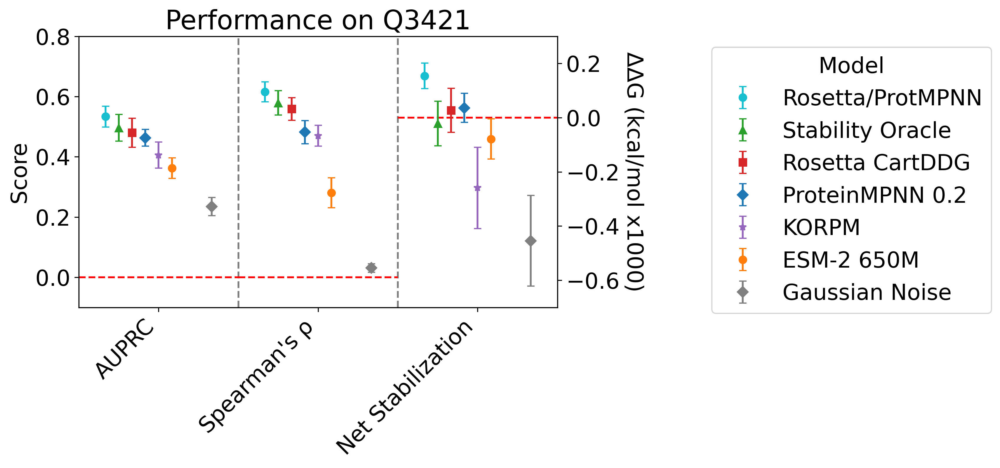

In [8]:
s2 = tmp1.sort_values('auprc_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'K1566_pslm_rfa_2_dir', 
            'K1566_pslm_rfa_3_dir', 
            'K1566_pslm_rfa_4_dir',
            'K1566_pslm_rfa_5_dir',
            'K1566_pslm_rfa_6_dir',
            'K1566_pslm_rfa_7_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)
plot_cols = ['auprc', 'spearman','net_stabilization']
plot_models = ['mpnn_rosetta', 'stability-oracle', 'cartesian_ddg', 'mpnn_20_00', 'korpm', 'esm2_650M', 'DDGun3D', 'INPS3D', 'random']
plot_title = 'Q3421'
y_lim = (-0.1, 0.8)
right_y_lim = (-.700, .300)
table_cols = ['auprc', 'spearman','net_stabilization', 'MCC', 'sensitivity', 'recall@k1.0']
saveloc = '../data/extended/q3421_extended_bootstrapped_formatted.csv'
analysis_utils.bootstrap_table(s3, 
                plot_cols,
                plot_models, 
                plot_title,
                y_lim,
                right_y_lim,
                table_cols, 
                var_cols=['net_stabilization'], #table_cols, 
                sort_col='auprc',
                saveloc=saveloc)

In [9]:
#summ2 = analysis_utils.compute_stats(db_class[original_pred_cols_reduced + ensemble_cols + ['cluster', 'ddG', 'mpnn_rosetta_dir']], 
#                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'tp', 'recall@k1.0', 'aumsc', 'auppc'), 
#                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=0)

### Recovery Curves (Visualization of Stable Mutant Enrichment, Figure 2)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

cartesian_ddg_dir
esm2_650M_dir
korpm_dir
mpnn_20_00_dir
mpnn_rosetta_dir
stability-oracle_dir
ddG_dir
random_dir


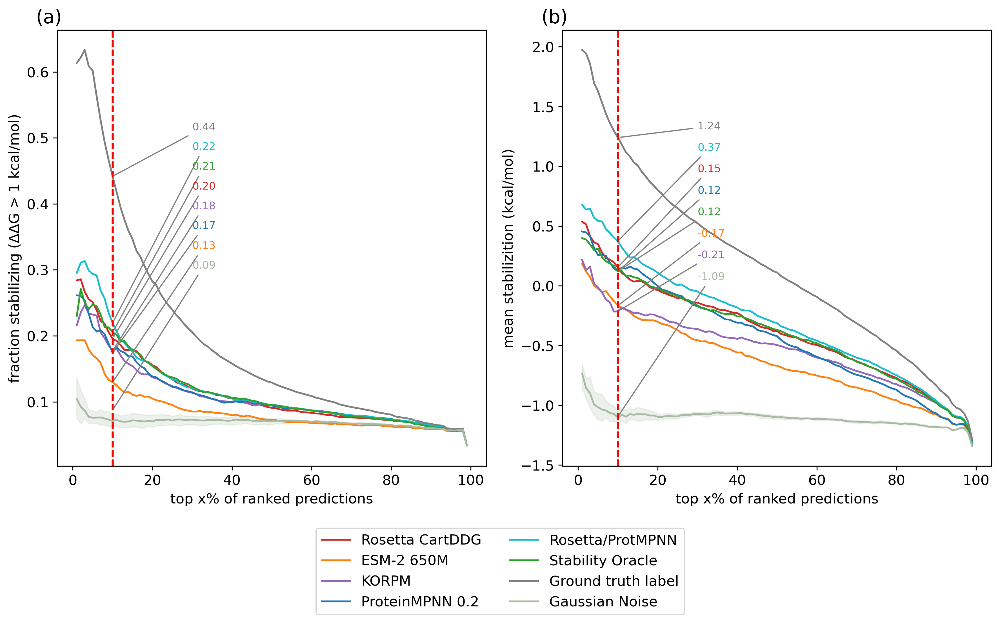

In [10]:
db_class_r = db_class.copy(deep=True)
db_class_r['random_2_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_3_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_4_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_5_dir'] = np.random.normal(loc=0, size=len(db_class_r))
class_result_new = analysis_utils.compute_stats(db_class_r, stats=('aumsc', 'auppc'), measurements=['ddG'], grouper='cluster', n_bootstraps=0)
crn = class_result_new.reset_index()
crn.loc[crn['model'].str.contains('random'), 'model'] = 'random_dir'
crn = crn.set_index(['measurement', 'model_type', 'model'])
crn

analysis_utils.recovery_curves(crn, ['mpnn_20_00_dir', 'cartesian_ddg_dir', 'mpnn_rosetta_dir', 'korpm_dir', 'esm2_650M_dir', 'stability-oracle_dir', 'ddG_dir', 'random_dir'], spacing=0.06, measurements=['ddG'], plots=['auppc', 'aumsc']) #'q3421_pslm_rfa_5_dir', 
# < 4 minutes

### Recovery Curves (Visualization of Stable Mutant Enrichment, Supplementary Figure 6)

In [11]:
class_result_new = analysis_utils.compute_stats(db_class_r, stats=('aumsc', 'auppc'), measurements=['ddG'], grouper='cluster', n_bootstraps=0)
crn2 = class_result_new.reset_index()
crn2.loc[crn2['model'].str.contains('random'), 'model'] = 'random_dir'
crn2 = crn2.set_index(['measurement', 'model_type', 'model'])
crn2

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

class  runtime        1%  \
measurement model_type   model                                                 
ddG         biophysical  cartesian_ddg_dir                     NaN  0.284091   
            ensemble     K1566_pslm_rfa_10_dir                 NaN  0.295455   
                         K1566_pslm_rfa_11_dir                 NaN  0.295455   
                         K1566_pslm_rfa_1_dir                  NaN  0.204545   
                         K1566_pslm_rfa_2_dir                  NaN  0.238636   
                         K1566_pslm_rfa_3_dir                  NaN  0.250000   
                         K1566_pslm_rfa_4_dir                  NaN  0.272727   
                         K1566_pslm_rfa_5_dir                  NaN  0.272727   
                         K1566_pslm_rfa_6_dir                  NaN  0.272727   
                         K1566_pslm_rfa_7_dir                  NaN  0.295455   
                         K1566_pslm_rfa_8_dir                  NaN  0.295455   
                         K1566_pslm_rfa_9_dir                  NaN  0.295455   
            evolutionary ankh_dir                              NaN  0.193182   
                         esm1v_1_dir                           NaN  0.170455   
                         esm1v_2_dir                           NaN  0.170455   
                         esm1v_3_dir                           NaN  0.181818   
                         esm1v_4_dir                           NaN  0.170455   
                         esm1v_5_dir                           NaN  0.181818   
                         esm1v_mean_dir                        NaN  0.181818   
                         esm1v_median_dir                      NaN  0.181818   
                         esm2_150M_dir                         NaN  0.227273   
                         esm2_15B_half_dir                     NaN  0.193182   
                         esm2_3B_dir                           NaN  0.181818   
                         esm2_650M_dir                         NaN  0.193182   
                         msa_1_dir                             NaN  0.193182   
                         msa_2_dir                             NaN  0.172840   
                         msa_3_dir                             NaN  0.185185   
                         msa_4_dir                             NaN  0.172840   
                         msa_5_dir                             NaN  0.209877   
                         msa_transformer_mean_dir              NaN  0.193182   
                         msa_transformer_median_dir            NaN  0.181818   
                         tranception_dir                       NaN  0.147727   
                         tranception_weights_dir               NaN  0.125000   
            potential    korpm_dir                             NaN  0.215909   
            structural   esmif_monomer_dir                     NaN  0.261364   
                         esmif_multimer_dir                    NaN  0.287356   
                         mif_dir                               NaN  0.272727   
                         mifst_dir                             NaN  0.204545   
                         mpnn_10_00_dir                        NaN  0.295455   
                         mpnn_20_00_dir                        NaN  0.261364   
                         mpnn_30_00_dir                        NaN  0.306818   
                         mpnn_rosetta_dir                      NaN  0.295455   
                         mutcomputex_dir                       NaN  0.204545   
            transfer     stability-oracle_dir                  NaN  0.229885   
            unknown      ddG_dir                               NaN  0.613636   
                         random_dir                            NaN  0.159091   
                         random_dir                            NaN  0.113636   
                         random_dir                            NaN  0.102273   
                         random_dir                 

ankh_dir
esm2_650M_dir
msa_transformer_mean_dir
tranception_weights_dir
esmif_multimer_dir
mif_dir
mpnn_20_00_dir
mutcomputex_dir
ddG_dir
random_dir


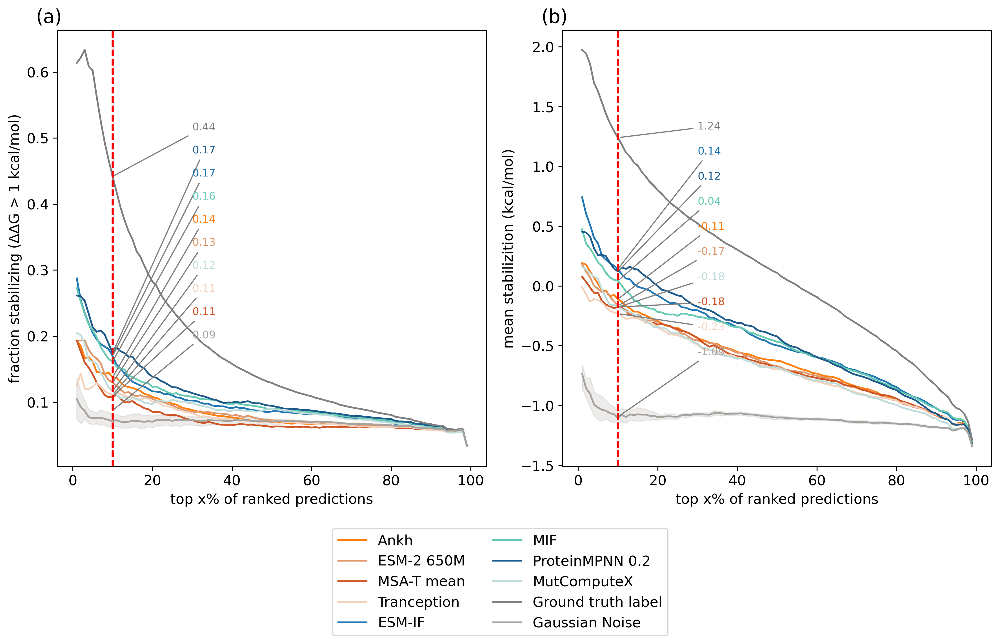

In [12]:
import importlib
importlib.reload(analysis_utils)
analysis_utils.recovery_curves(crn2, ['mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'tranception_weights_dir', 'mutcomputex_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc'])

### Bootstrapped Q3421 Analysis (Used for Figure 1 and Extended Data Table 1)

### Visualization of Prediction Distributions (Supplementary Figure 1)

       cluster         variable     value
5           14  ProteinMPNN 0.2 -4.868845
6           14  ProteinMPNN 0.2 -5.349944
7           14  ProteinMPNN 0.2 -3.854781
8           14  ProteinMPNN 0.2 -5.797238
9           14  ProteinMPNN 0.2 -4.735646
...        ...              ...       ...
10258        9              ΔΔG  1.100000
10259        9              ΔΔG  1.400000
10260        9              ΔΔG  0.900000
10261        9              ΔΔG -0.100000
10262        9              ΔΔG  0.400000

[3030 rows x 3 columns]


<Axes: xlabel='cluster', ylabel='value'>

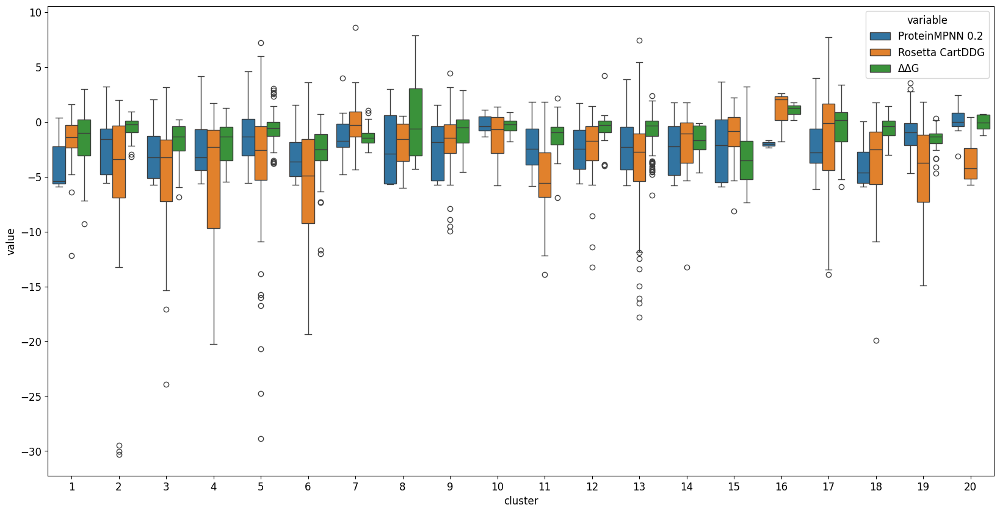

In [13]:
db_plot = db_class.copy(deep=True)
db_plot = db_plot.loc[~db_plot['ddG_dir'].isna()]
db_plot = db_plot.rename({'ddG_dir': 'ΔΔG', 'mpnn_20_00_dir': 'ProteinMPNN 0.2', 'cartesian_ddg_dir': 'Rosetta CartDDG'}, axis=1)
db_plot = db_plot[['cluster', 'ProteinMPNN 0.2', 'Rosetta CartDDG', 'ΔΔG']].melt(id_vars='cluster')
db_plot = db_plot.loc[db_plot['cluster']<21]
print(db_plot)
fig, ax = plt.subplots(figsize=(20, 10))
sns.boxplot(db_plot, x='cluster', y='value', hue='variable', ax=ax)

### Supplementary Table 5

In [14]:
summ2 = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'accuracy', 'mse', 'net_stabilization', 'mean_stabilization', 'precision', 'recall'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=100, quiet=True)
tmp2 = summ2.reset_index()

# < 1 minute

In [15]:
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k',
    'mean_squared_error': 'MSE'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = summ2.sort_values('mean_squared_error_mean', ascending=True).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir'])].drop('measurement', axis=1)
s4 = s3[['model_type', 'model', 'n_mean', 'n_std',
    'mean_squared_error_mean', 'mean_squared_error_std',
    'accuracy_mean', 'accuracy_std',
    'spearman_mean', 'spearman_std',
    'weighted_spearman_mean', 'weighted_spearman_std',
    'net_stabilization_mean', 'net_stabilization_std',
    ]]
s4['model'] = s4['model'].map(remap_names_2)
s5 = s4.set_index(['model_type', 'model'])
s5.columns = [new_remap_cols[c] for c in s5.columns]
vis = s5.copy()

# Iterate over the DataFrame and update the mean columns
stdev_cols = ['MSE mean', 'Net Stabilization mean']
for column in s5.columns:
    if 'mean' in column and column in stdev_cols:
        stdev_column = column.replace('mean', 'stdev')
        s5[column] = s5[column].round(2).astype(str) + ' ± ' + s5[stdev_column].round(1).astype(str)
    elif 'mean' in column:
        s5[column] = s5[column].round(2).astype(str)

# Drop the standard deviation columns
s5 = s5[[col for col in s5.columns if 'stdev' not in col]]
s5.columns = [col[:-5] for col in s5.columns]
s6 = s5.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)
s7 = s6.drop('n', axis=1).set_index(['Model Type', 'Model'])
s7.to_csv('../data/extended/q3421_extended_bootstrapped_other_stats.csv', encoding='utf-8-sig')

for column in vis.columns:
    if 'mean' in column: # and column in stdev_cols:
        stdev_column = column.replace('mean', 'stdev')
        vis[column] = vis[column].round(2).astype(str) + ' ± ' + vis[stdev_column].round(2).astype(str)
vis = vis[[col for col in vis.columns if 'stdev' not in col]]
vis.columns = [col[:-5] for col in vis.columns]
vis = vis.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)

vis

,Model Type,Model,n,MSE,Accuracy,Spearman's ρ,wρ,Net Stabilization
0,unknown,ΔΔG label,3359.4 ± 727.69,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,778.57 ± 139.32
1,transfer,Stability Oracle,3339.14 ± 726.98,2.95 ± 0.59,0.77 ± 0.01,0.58 ± 0.04,0.46 ± 0.03,-21.42 ± 82.99
2,potential,KORPM,3359.4 ± 727.69,3.55 ± 0.62,0.73 ± 0.02,0.47 ± 0.03,0.34 ± 0.03,-240.29 ± 132.91
3,structural,MutComputeX,3346.2 ± 726.8,3.98 ± 0.58,0.78 ± 0.02,0.36 ± 0.04,0.28 ± 0.03,-23.48 ± 49.19
4,unknown,Gaussian Noise,3359.4 ± 727.69,4.79 ± 0.53,0.71 ± 0.02,0.03 ± 0.02,0.02 ± 0.03,-420.11 ± 158.19
5,structural,ESM-IF,3356.28 ± 728.08,4.98 ± 0.62,0.77 ± 0.02,0.45 ± 0.04,0.41 ± 0.02,26.38 ± 47.35
6,structural,ESM-IF(M),3359.4 ± 727.69,4.98 ± 0.63,0.77 ± 0.02,0.43 ± 0.04,0.38 ± 0.03,-21.22 ± 62.49
7,evolutionary,Tranception (reduced),3359.4 ± 727.69,5.03 ± 0.63,0.78 ± 0.02,0.25 ± 0.05,0.21 ± 0.04,13.4 ± 21.55
8,evolutionary,Tranception,3359.4 ± 727.69,5.03 ± 0.63,0.78 ± 0.02,0.26 ± 0.05,0.23 ± 0.04,37.7 ± 26.02
9,structural,ProteinMPNN 0.3,3359.4 ± 727.69,7.21 ± 0.74,0.78 ± 0.02,0.47 ± 0.04,0.42 ± 0.03,7.84 ± 50.96


### Figure 1

In [16]:
db_new = pd.read_csv('~/PSLMs/data/inference/tranception_results.csv', index_col=0)
db_new = db_new.rename({'tranception_weights_dir': 'tranception_new_dir', 'runtime_tranception_weights_dir': 'runtime_tranception_new_dir'}, axis=1)
db['uid3'] = db['code'] + '_' + (db['position']-db['offset_up']).astype(str) + db['mutation']
db_new = db.reset_index().set_index('uid3').join(db_new).reset_index().set_index('uid')
db_new[['tranception_new_dir']]

,tranception_new_dir
uid,
1A23_30S,-0.109360
1A23_32L,-0.059789
1A23_32S,-0.032388
1A23_32Y,-0.039155
1A23_33S,-0.075979
...,...
5CRO_26L,-0.105731
5CRO_26Q,-0.045138
5CRO_26V,-0.045453


### Additional Figure describing correlation between predictions and scores of two selected models

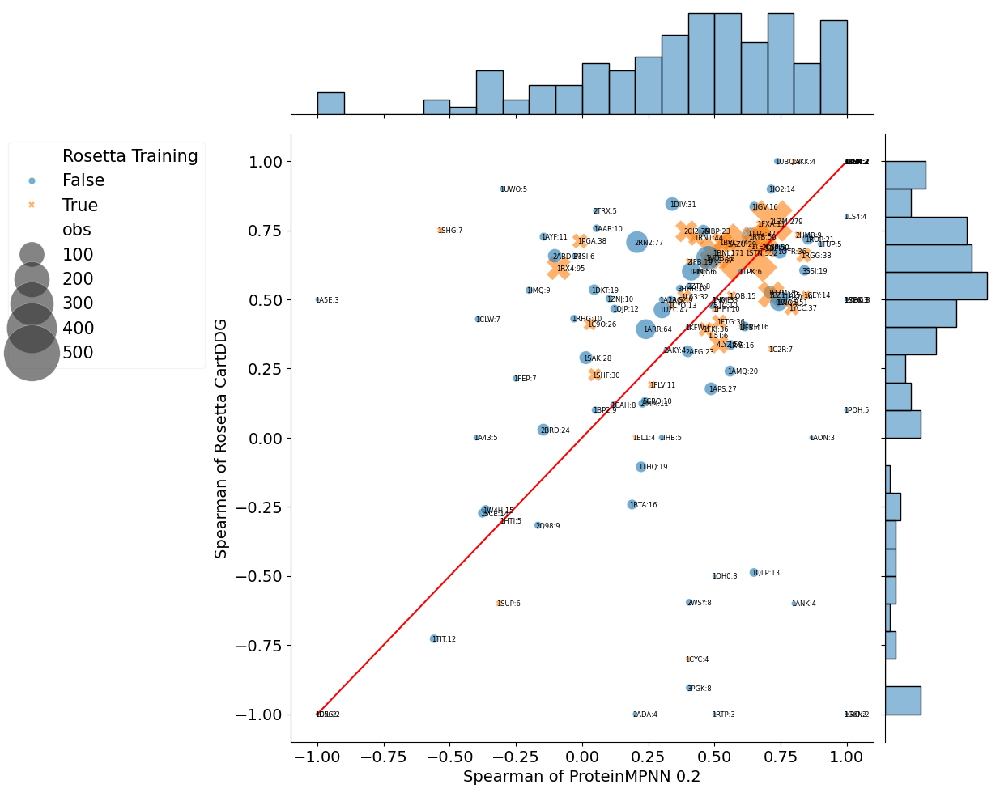

In [17]:
importlib.reload(analysis_utils)

col = 'Rosetta Training'
db_class_2 = db_class.copy(deep=True)
#db_class_2 = db_class_2.join(db_new[['tranception_new_dir']])
db_class_2['ddG_dir'] = db_class_2['ddG']
db_class_2[col] = db['overlaps_seq_rosetta']
db_class_2['code'] = db_class_2.reset_index('uid2').index.str[:4]
_ = analysis_utils.correlations(db_class_2, None, stat='spearman', marker_name=col,
    score_name='cartesian_ddg_dir', score_name_2='mpnn_20_00_dir', min_obs=1, group=True, plot=True, out=True, runtime=False)

### Figure 4 a&b

  0%|          | 0/1000 [00:00<?, ?it/s]

718.6666666666666
725.3333333333334
class
0 >= ΔΔG > -1.5    907
ΔΔG <= -1.5        770
ΔΔG > 0            479
Name: n, dtype: int64


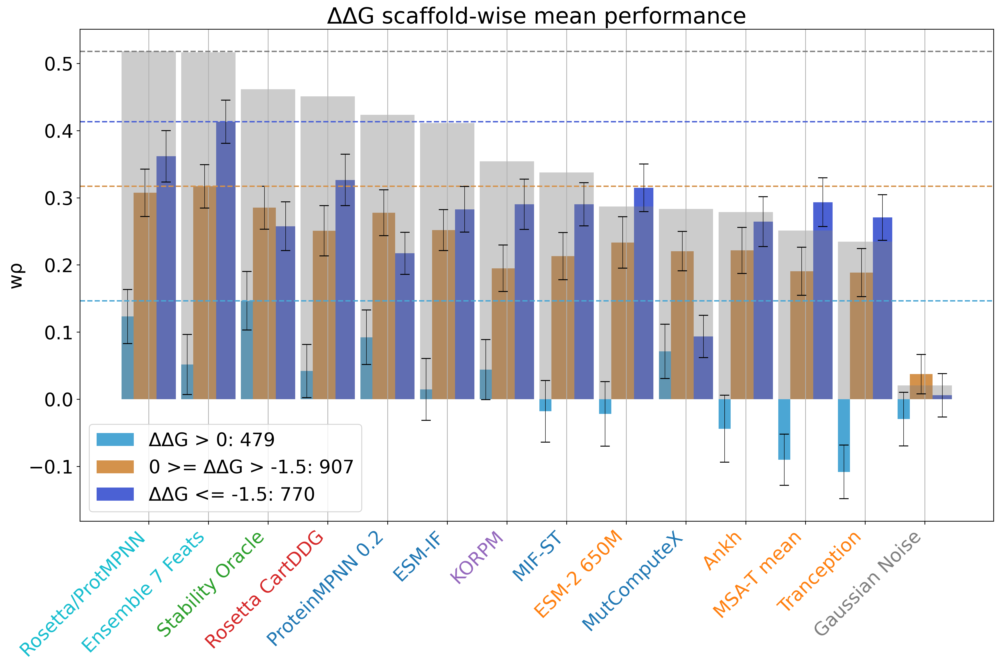

In [18]:
subset = ['K1566_pslm_rfa_7_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_weights_dir',
            'esm2_650M_dir',
            #'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            'mpnn_rosetta_dir',
            #'mpnn_10_00_dir',
            'mpnn_20_00_dir',
            #'mpnn_30_00_dir',
            #'mif_dir',
            'mifst_dir',
            'mutcomputex_dir',
            'stability-oracle_dir',
            'random_dir',
            'ddG_dir']
db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
# fillna only applies to a handful of predictions from Stability Oracle
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']].fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        count_muts = True,
                        subset = subset,
                        grouper = 'cluster',
                        plots = 'top',
                        drop_label = True,
                        )  
# < 10 seconds

(0.0, 50.0)

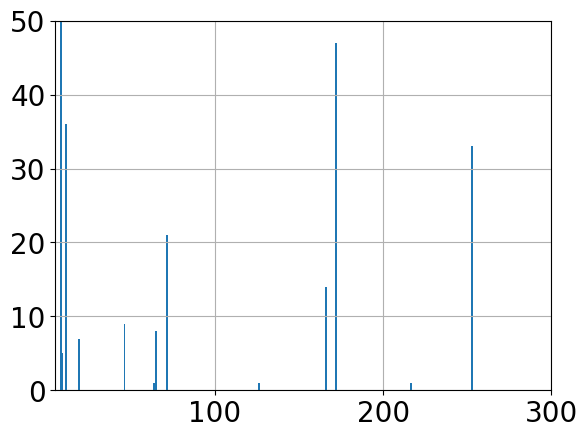

In [19]:
db_complete.loc[db_complete['neff'] < 1000, 'neff'].hist(bins=1000)
plt.xlim(5,300)
plt.ylim(0,50)

### Figure 4 c&d

  0%|          | 0/1000 [00:00<?, ?it/s]

conservation > 80% : 355
conservation <= 80% : 1802
class
conservation <= 80    1802
conservation > 80      355
Name: n, dtype: int64


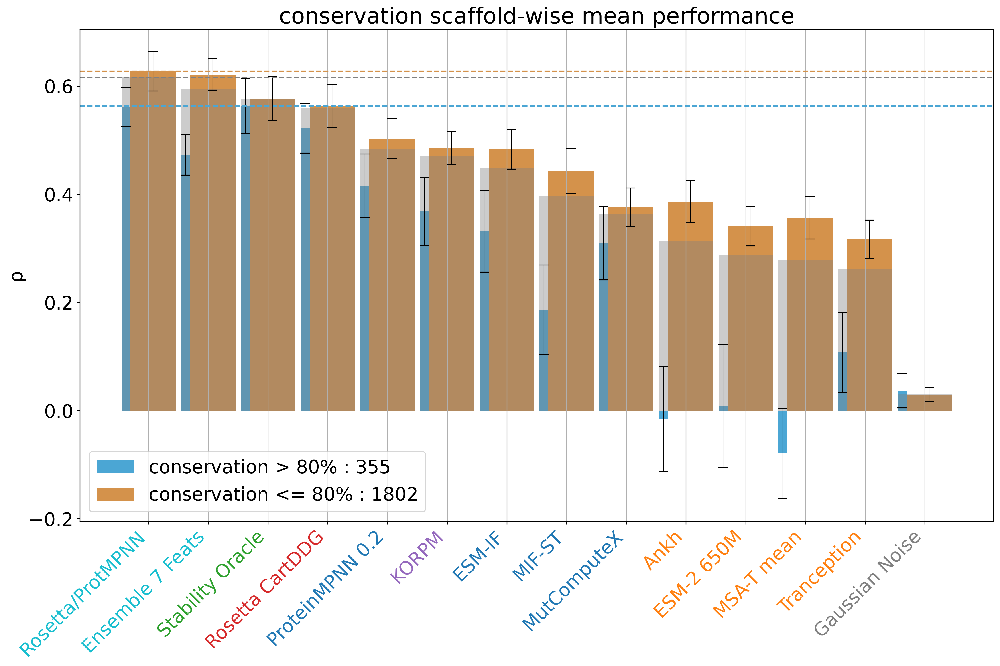

In [20]:
db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
            
current_feats = ['conservation', 'neff', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'conservation', 
                        #split_col_2 = 'conservation', 
                        threshold_1 = 80, 
                        #threshold_2 = 80, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        plots='top',
                        drop_label = True
                        )

  0%|          | 0/1000 [00:00<?, ?it/s]

class
neff <= 300     307
neff > 300     1870
Name: n, dtype: int64


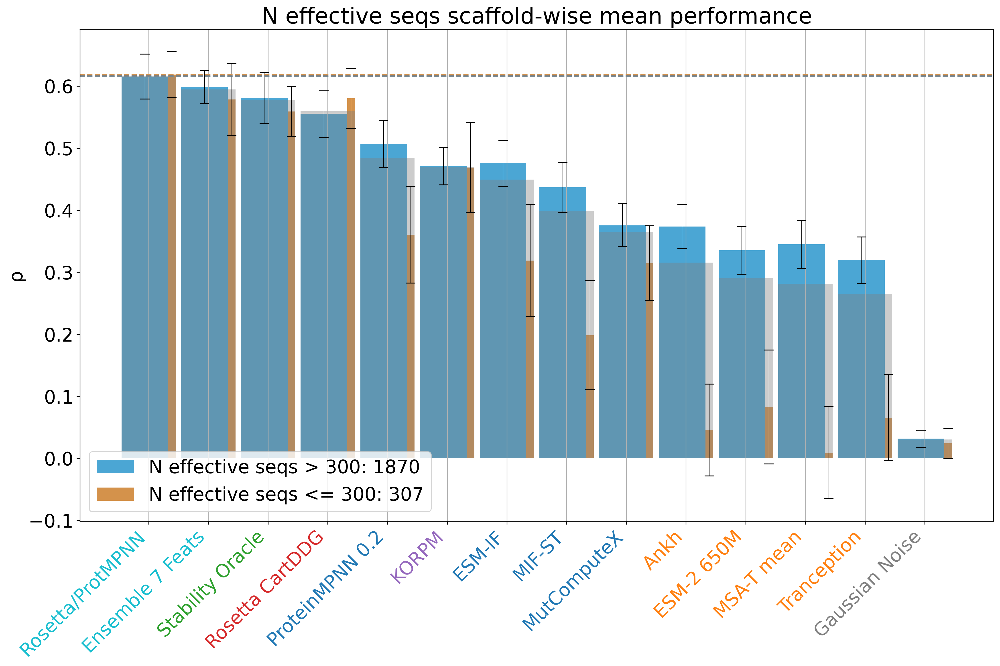

In [21]:
current_feats = ['conservation', 'neff', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'neff', 
                        #split_col_2 = 'conservation', 
                        threshold_1 = 300, 
                        #threshold_2 = 80, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        plots='top',
                        drop_label = True
                        )
# < 10 seconds

  0%|          | 0/1000 [00:00<?, ?it/s]

538.5
545.5
['ddG_dir', 'mpnn_rosetta_dir', 'K1566_pslm_rfa_7_dir', 'stability-oracle_dir', 'cartesian_ddg_dir', 'mpnn_20_00_dir', 'korpm_dir', 'esmif_multimer_dir', 'mifst_dir', 'mutcomputex_dir', 'ankh_dir', 'esm2_650M_dir', 'msa_transformer_mean_dir', 'tranception_weights_dir', 'random_dir']
class
delta_kdh <= 0 & rel_ASA <= 0.2    593
delta_kdh <= 0 & rel_ASA > 0.2     430
delta_kdh > 0 & rel_ASA <= 0.2     431
delta_kdh > 0 & rel_ASA > 0.2      700
Name: n, dtype: int64


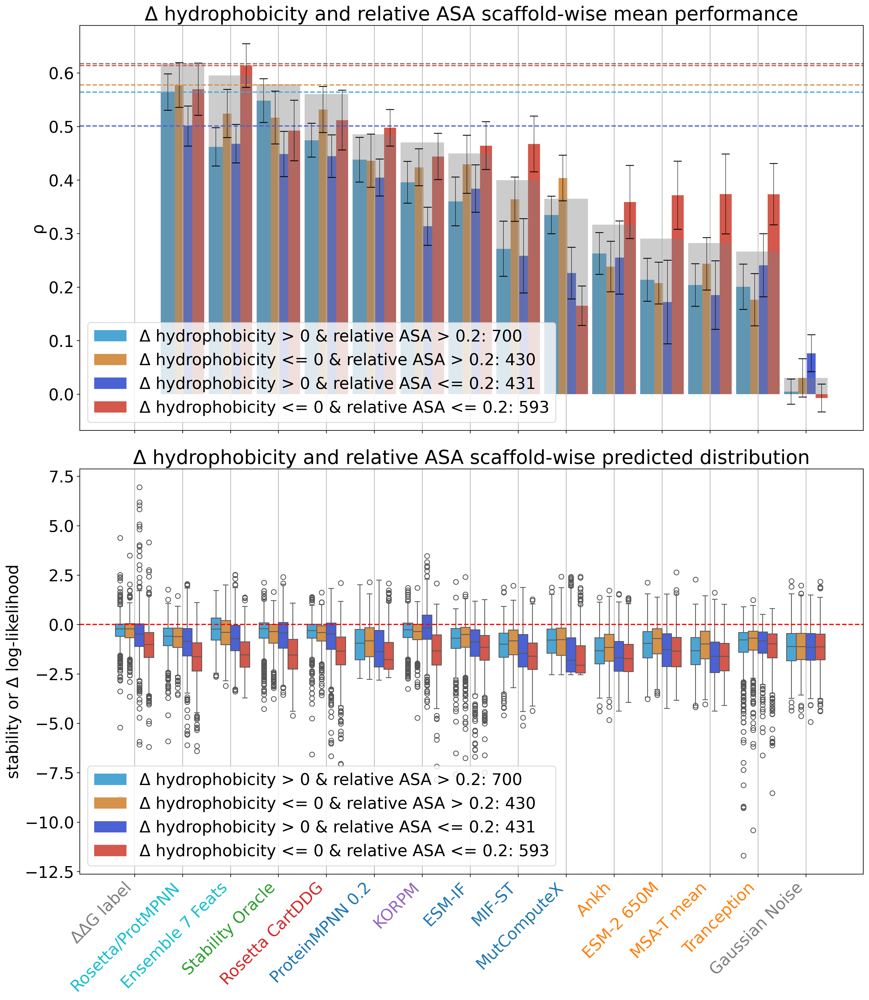

In [22]:
current_feats = ['delta_kdh_dir', 'rel_ASA_dir', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
l1 = len(db_fig)
db_fig = db_fig.fillna(0)
#db_fig = db_fig.drop(['delta_kdh_dir', 'rel_ASA_dir'], axis=1)
db_fig = db_fig.rename({'delta_kdh_dir': 'delta_kdh', 'rel_ASA_dir': 'rel_ASA'}, axis=1)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_kdh', 
                        split_col_2 = 'rel_ASA', 
                        threshold_1 = 0, 
                        threshold_2 = 0.2, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        )
# < 10 seconds

### Generating the pairwise ensembles used in the model complementarity section

In [23]:
zs_feats = ['rel_ASA', 'delta_kdh', 'delta_vol', 'delta_chg']
models = original_pred_cols_reduced + [c + '_dir' for c in zs_feats]
#models += ['mpnn_mean_dir', 'esmif_mean_dir', 'esm2_mean_dir', 'mif_mean_dir']

#db_summ = db_preds.join(db_ddg).join(db_cluster)
#db_summ = db_class
#db_summ['ddG_dir'] = db_summ['ddG']
#db_summ['random_dir'] = np.random.normal(loc=0, size=len(db_summ))

dfm = db[models + ['cluster', 'ddG']] #db_summ.join(db_feats_2[zs_feats].drop_duplicates(), how='left')
#dfm['code'] = dfm.reset_index('uid2').index.str[:4]
ren = dict(zip(zs_feats, [f+'_dir' for f in zs_feats]))
dfm = dfm.rename(ren, axis=1)
dfr = db_runtimes.copy(deep=True).reset_index(level=0, drop=True)#.drop('uid', axis=1)
dfr['code'] = dfr.index.str[:4]
dfr[['runtime_' + r for r in ['rel_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir']]] = 0
dfr['runtime_mutcomputex_dir'] = np.nan
dfr['runtime_stability-oracle_dir'] = np.nan

weights = [1, 0.5, 0.2] #, -0.2] # could include -0.2 to allow for subtracting models
weights2 = [] # fill in weights to test 3-model ensembles
#weights2 = [0.8, 0.3]

all_cols = []

tmp_preds = []
tmp_runtimes = []
for model1 in models:
    for model2 in models:
        if model1 != model2:
            for weight in weights:
                tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight, name=f'{model1} + {model2} * {weight}'))
                #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model1].max() * weight, name=f'{model1} + {model2} * {weight}'))
                all_cols.append(f'{model1} + {model2} * {weight}')
                tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2], name=f'runtime_'+all_cols[-1]))
                for model3 in models:
                    if model3 != model2:
                    #if (model1.split('_')[0] != model3.split('_')[0]) and (model2.split('_')[0] != model3.split('_')[0]):
                        for weight2 in weights2:
                            tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight + dfm[model3]/dfm[model3].std() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model2].max() * weight + (dfm[model3]-dfm[model3].min())/dfm[model3].max() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            all_cols.append(f'{model1} + {model2} * {weight} + {model3} * {weight2}')
                            #tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2] + dfr['runtime_'+model3], name='runtime_'+all_cols[-1]))

print('concatenating')
dfm = pd.concat([dfm] + tmp_preds, axis=1)
dfr = pd.concat([dfr] + tmp_runtimes, axis=1)
print('joining...')
dfm = dfm.join(dfr.drop('code', axis=1))
dfm

# < 10 seconds

concatenating
joining...


,,esmif_monomer_dir,msa_transformer_median_dir,msa_transformer_mean_dir,mutcomputex_dir,stability-oracle_dir,esm2_3B_dir,esm2_15B_half_dir,esmif_multimer_dir,mpnn_10_00_dir,mpnn_20_00_dir,...,runtime_delta_chg_dir + cartesian_ddg_dir * 0.2,runtime_delta_chg_dir + rel_ASA_dir * 1,runtime_delta_chg_dir + rel_ASA_dir * 0.5,runtime_delta_chg_dir + rel_ASA_dir * 0.2,runtime_delta_chg_dir + delta_kdh_dir * 1,runtime_delta_chg_dir + delta_kdh_dir * 0.5,runtime_delta_chg_dir + delta_kdh_dir * 0.2,runtime_delta_chg_dir + delta_vol_dir * 1,runtime_delta_chg_dir + delta_vol_dir * 0.5,runtime_delta_chg_dir + delta_vol_dir * 0.2
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_30S,1A23_30S,-0.043712,-8.570910,-8.462356,-0.010359,-0.420,-11.571676,-11.668701,-0.043713,1.969108,2.077375,...,5,0,0,0,0,0,0,0,0,0
1A23_32L,1A23_32L,-0.042389,-7.639166,-7.748131,0.383801,0.528,-13.755667,-13.076172,-0.042389,-0.021528,2.326742,...,6,0,0,0,0,0,0,0,0,0
1A23_32S,1A23_32S,-0.029983,-5.161361,-5.346782,-0.003409,-0.170,-8.291791,-10.436035,-0.029983,0.243430,0.858738,...,6,0,0,0,0,0,0,0,0,0
1A23_32Y,1A23_32Y,-0.020219,-4.510036,-4.245017,0.060203,0.732,-8.121881,-9.415039,-0.020220,-0.115764,0.649091,...,6,0,0,0,0,0,0,0,0,0
1A23_33S,1A23_33S,-0.024960,-7.309464,-7.304522,-0.327936,-1.156,-12.002896,-12.722168,-0.024960,1.373216,-0.305126,...,6,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,5CRO_26L,-0.037373,-0.298061,-0.834436,0.002285,0.628,-3.150103,-2.374512,-0.038054,0.082326,0.305977,...,6,0,0,0,0,0,0,0,0,0
5CRO_26Q,5CRO_26Q,-0.004605,1.459888,0.721684,0.013478,0.921,-2.508844,-2.625244,-0.006247,1.808440,1.264375,...,6,0,0,0,0,0,0,0,0,0
5CRO_26V,5CRO_26V,0.037691,0.751292,-0.029315,0.043387,0.513,-3.204980,-2.228027,0.032355,1.397881,0.928658,...,6,0,0,0,0,0,0,0,0,0


### Function to retrieve all the pairwise predictions (precalculated for this demo)

In [24]:
def get_summary_df(db_complete, cols=None, class_stats=(), saveloc='../data/pairwise/q3421_pairwise.csv', overwrite=False):

    if not overwrite:
        assert not os.path.exists(saveloc)
    if cols is None:
        cols = db_complete.columns

    df_summ = analysis_utils.compute_stats(db_complete[cols], stats=class_stats, measurements=['ddG'], grouper='cluster').reset_index().set_index(['measurement', 'model'])
    df_summ = df_summ.reset_index().rename({'index': 'model'}, axis=1)
    df_summ = df_summ.set_index(['measurement', 'model_type', 'model', 'class'])

    df_summ.to_csv(saveloc)
    return df_summ

### Pairwise statistics for all model combinations

In [25]:
# compute all statistics on the combined set (already done, takes ~12 hours)
d1 = get_summary_df(dfm, saveloc=os.path.join(path, 'data', 'pairwise', 'pairwise_q3421_combinations_3_weights.csv'), overwrite=True)
d1 = pd.read_csv(os.path.join(path, 'data', 'pairwise', 'pairwise_q3421_combinations_3_weights.csv')).set_index(['measurement', 'model_type', 'model', 'class'])
d1.xs('ddG').sort_values('aumsc', ascending=False).iloc[:20, 13:]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1976 [00:00<?, ?it/s]

auroc  \
model_type  model                                          class             
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.783691   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5       NaN    0.779256   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.5       NaN    0.783507   
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5    NaN    0.792048   
biophysical mpnn_20_00_dir + cartesian_ddg_dir * 1         NaN    0.777436   
            cartesian_ddg_dir + mpnn_20_00_dir * 1         NaN    0.777436   
transfer    mpnn_20_00_dir + stability-oracle_dir * 1      NaN    0.785490   
            stability-oracle_dir + mpnn_20_00_dir * 1      NaN    0.785490   
biophysical cartesian_ddg_dir + stability-oracle_dir * 1   NaN    0.796168   
            stability-oracle_dir + cartesian_ddg_dir * 1   NaN    0.796168   
            cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.791328   
            mpnn_10_00_dir + cartesian_ddg_dir * 1         NaN    0.776392   
            cartesian_ddg_dir + mpnn_10_00_dir * 1         NaN    0.776392   
transfer    mpnn_10_00_dir + stability-oracle_dir * 1      NaN    0.782551   
            stability-oracle_dir + mpnn_10_00_dir * 1      NaN    0.782551   
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.2       NaN    0.777314   
transfer    stability-oracle_dir + mpnn_20_00_dir * 0.5    NaN    0.793441   
            stability-oracle_dir + mpnn_30_00_dir * 0.5    NaN    0.790866   
biophysical cartesian_ddg_dir + esmif_multimer_dir * 0.5   NaN    0.767683   
transfer    mpnn_30_00_dir + stability-oracle_dir * 1      NaN    0.780815   

                                                                     auprc  \
model_type  model                                          class             
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.530218   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5       NaN    0.523187   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.5       NaN    0.532083   
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5    NaN    0.524390   
biophysical mpnn_20_00_dir + cartesian_ddg_dir * 1         NaN    0.525606   
            cartesian_ddg_dir + mpnn_20_00_dir * 1         NaN    0.525606   
transfer    mpnn_20_00_dir + stability-oracle_dir * 1      NaN    0.519869   
            stability-oracle_dir + mpnn_20_00_dir * 1      NaN    0.519869   
biophysical cartesian_ddg_dir + stability-oracle_dir * 1   NaN    0.529939   
            stability-oracle_dir + cartesian_ddg_dir * 1   NaN    0.529939   
            cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.522532   
            mpnn_10_00_dir + cartesian_ddg_dir * 1         NaN    0.525923   
            cartesian_ddg_dir + mpnn_10_00_dir * 1         NaN    0.525923   
transfer    mpnn_10_00_dir + stability-oracle_dir * 1      NaN    0.522305   
            stability-oracle_dir + mpnn_10_00_dir * 1      NaN    0.522305   
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.2       NaN    0.514754   
transfer    stability-oracle_dir + mpnn_20_00_dir * 0.5    NaN    0.523954   
            stability-oracle_dir + mpnn_30_00_dir * 0.5    NaN    0.521065   
biophysical cartesian_ddg_dir + esmif_multimer_dir * 0.5   NaN    0.503517   
transfer    mpnn_30_00_dir + stability-oracle_dir * 1      NaN    0.517759   

                                                                  0.0_n_stable  \
model_type  model                                          class                 
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN           761.0   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5       NaN           761.0   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.5       NaN           761.0   
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5    NaN           752.0   
biophysical mpnn_20_00_dir + cartesian_ddg_dir * 1         NaN           761.0   
            cartesian_ddg_dir + mpnn_20_00_dir * 1         Na

### Supplementary Figure 7

3421


  0%|          | 0/5 [00:00<?, ?it/s]

0.08552814608455178
['Stability Oracle', 'Rosetta CartDDG', 'ProteinMPNN 0.2', 'KORPM', 'MIF', 'ESM-IF', 'MIF-ST', 'MutComputeX', 'Ankh', 'MSA-T mean', 'Tranception (reduced)', 'ESM-1V mean']


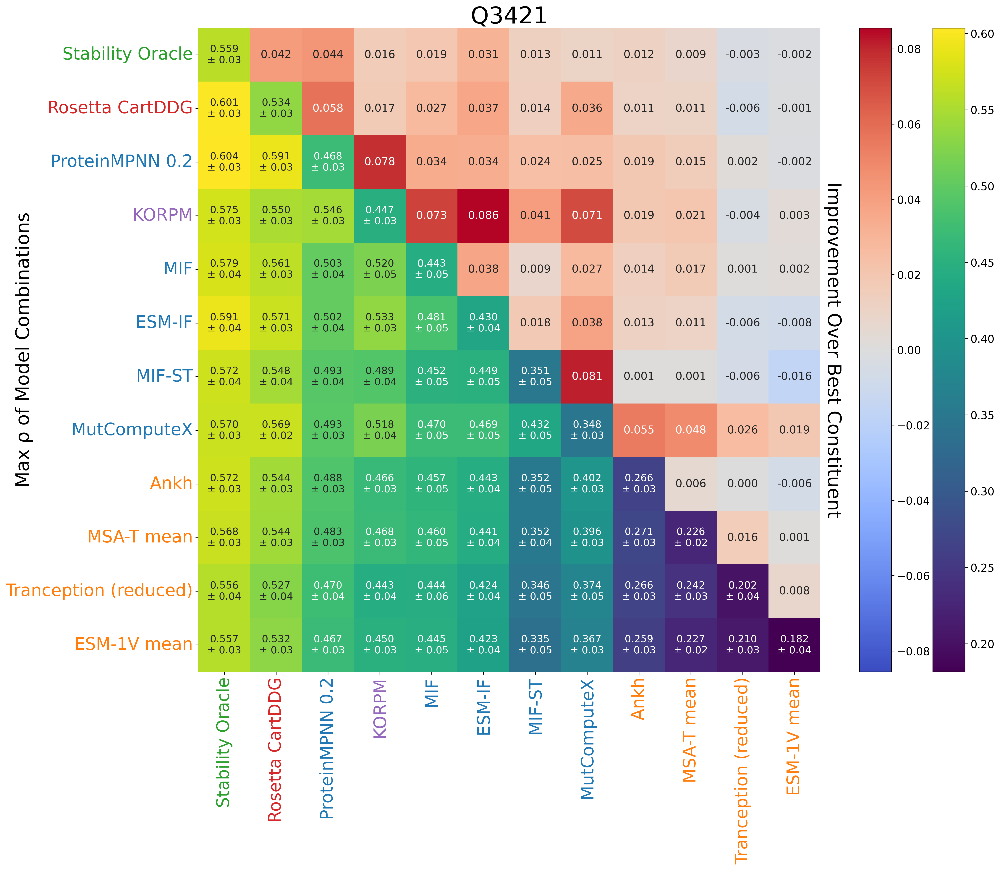

,model1,weight1,model2,weight2,mean_spearman,p_value
rank,,,,,,
1,stability-oracle_dir,1,mpnn_20_00_dir,0.5,0.603577,0.000047
2,cartesian_ddg_dir,1,stability-oracle_dir,1,0.600879,0.00002
3,stability-oracle_dir,1,cartesian_ddg_dir,0.5,0.595537,0.000006
4,mpnn_20_00_dir,1,stability-oracle_dir,1,0.595131,0.000463
5,cartesian_ddg_dir,1,stability-oracle_dir,0.5,0.594898,0.000132
...,...,...,...,...,...,...
326,esm1v_mean_dir,1,ankh_dir,0.2,0.206945,0.014627
327,tranception_dir,1,esm1v_mean_dir,1,0.204977,0.823303
328,esm1v_mean_dir,1,msa_transformer_mean_dir,0.2,0.202538,0.194874


In [26]:
subset2 = [
            'cartesian_ddg_dir',
            'esm1v_mean_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'ankh_dir',
            'esm2_dir',
            'esmif_multimer_dir',
            'mpnn_20_00_dir',
            'mif_dir',
            'mifst_dir',
            'korpm_dir',
            'mutcomputex_dir',
            'stability-oracle_dir'
        ]

measurement = 'ddG'
statistic = 'spearman'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=5, upper=upper, subset=subset2, title='Q3421')
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
stat_df

### Extra Figure (not in text) showing Net Stabilization instead

3421


  0%|          | 0/5 [00:00<?, ?it/s]

231.764
['ProteinMPNN 0.2', 'Rosetta CartDDG', 'ESM-IF', 'Stability Oracle', 'MIF-ST', 'MutComputeX', 'Ankh', 'MIF', 'Tranception (reduced)', 'MSA-T mean', 'KORPM', 'ESM-1V mean']


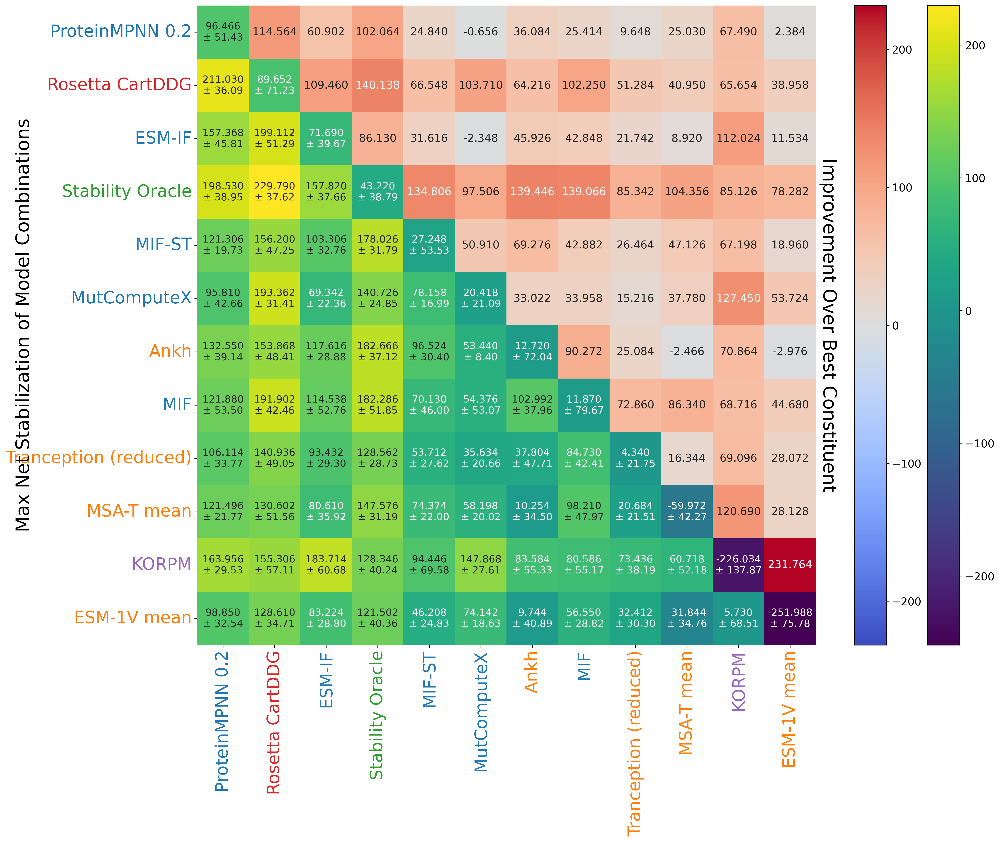

,model1,weight1,model2,weight2,mean_net_stabilization,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,stability-oracle_dir,0.5,229.79,0.007463
2,cartesian_ddg_dir,1,stability-oracle_dir,1,227.842,0.017907
3,cartesian_ddg_dir,1,mpnn_20_00_dir,0.2,211.03,0.004278
4,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,210.022,0.002747
5,cartesian_ddg_dir,1,mpnn_20_00_dir,1,200.496,0.002737
...,...,...,...,...,...,...
326,esm1v_mean_dir,1,stability-oracle_dir,0.2,-96.278,0.000059
327,esm1v_mean_dir,1,mifst_dir,0.2,-101.402,0.002841
328,esm1v_mean_dir,1,msa_transformer_mean_dir,0.2,-107.972,0.071528


In [ ]:
measurement = 'ddG'
statistic = 'net_stabilization'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=5, upper=upper, subset=subset2)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
#stat_df.loc[stat_df['runtime_gpu']<0, 'runtime_gpu'] = np.nan
stat_df

# ~ 10 seconds

### Supplementary Figure 8

0.0013924680652412


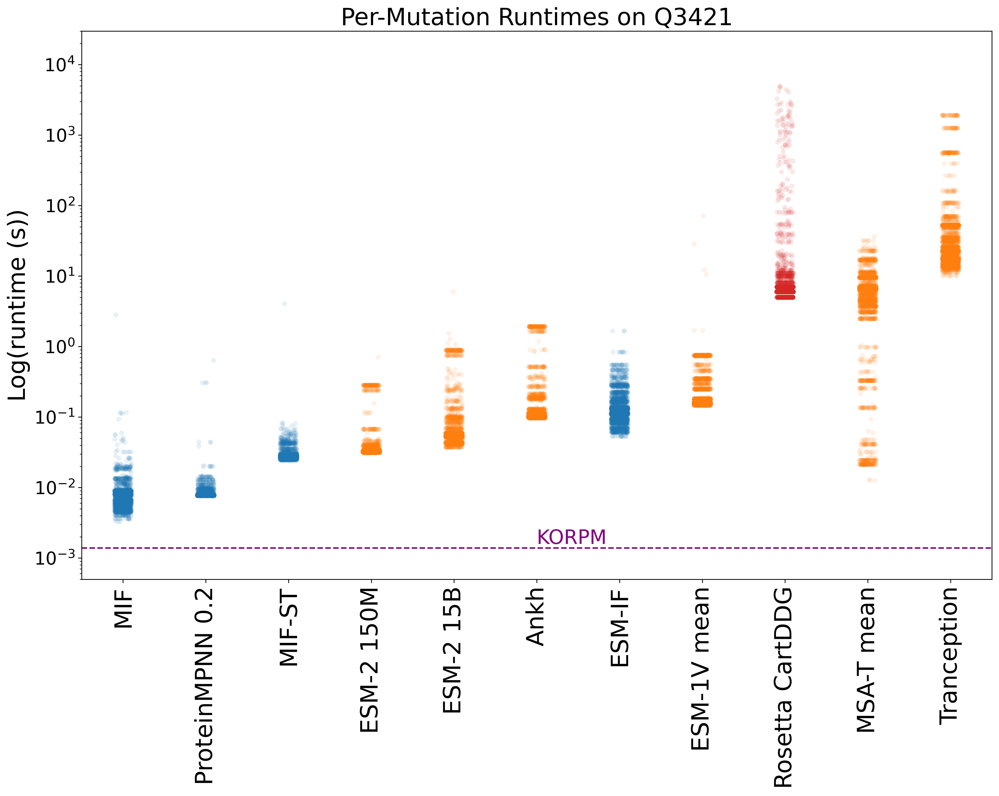

In [ ]:
int_runtimes = db_runtimes.dropna(axis=1, how='all')#.groupby('code').mean()#.sum() #uncomment to get mean per protein
int_runtimes = int_runtimes[[
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_tranception_weights_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm2_150M_dir',
                             'runtime_cartesian_ddg_dir',
                             'runtime_ankh_dir',
                             'runtime_esm2_15B_half_dir',
                             'runtime_korpm_dir'
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
#int_runtimes.columns = int_runtimes.columns.map(analysis_utils.remap_names)
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)

### determine order for displaying runtimes
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])
korpm_time = total_runtimes.loc[total_runtimes['variable']=='korpm', 'value'].mean()
print(korpm_time)
total_runtimes = total_runtimes.loc[total_runtimes['variable']!='korpm']

total_runtimes['category'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_category(x))
total_runtimes['color'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_base_color(x))

custom_palette = [
    (0.12156863, 0.46666667, 0.70588235),  # blue
    (1.0, 0.49803922, 0.05490196),  # orange
    (0.8392156862745098, 0.153, 0.153)  # red
]

# Set the custom palette
sns.set_palette(custom_palette)

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10), dpi=300)  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', hue='color', alpha=0.1, legend=False)

plt.axhline(y=korpm_time, color='purple', linestyle='--', label='KORPM')
plt.text(5, korpm_time, 'KORPM', color='purple', verticalalignment='bottom')

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
plt.title('Per-Mutation Runtimes on Q3421')
plt.yscale('log')
plt.ylim(0.0005, 30000)
plt.xticks(rotation=90, fontsize=24)
plt.xlabel('')
plt.yticks(fontsize=18)
plt.ylabel('Log(runtime (s))', fontsize=24)
plt.show()

### Following cells relate to preprocessing required for Supplementary Figure 2

### Supplementary Figure 2

[ 5.59485531e-01  5.00000000e-01  4.67018470e-01  0.00000000e+00
 -9.03538256e-06  0.00000000e+00 -5.43614752e-04]


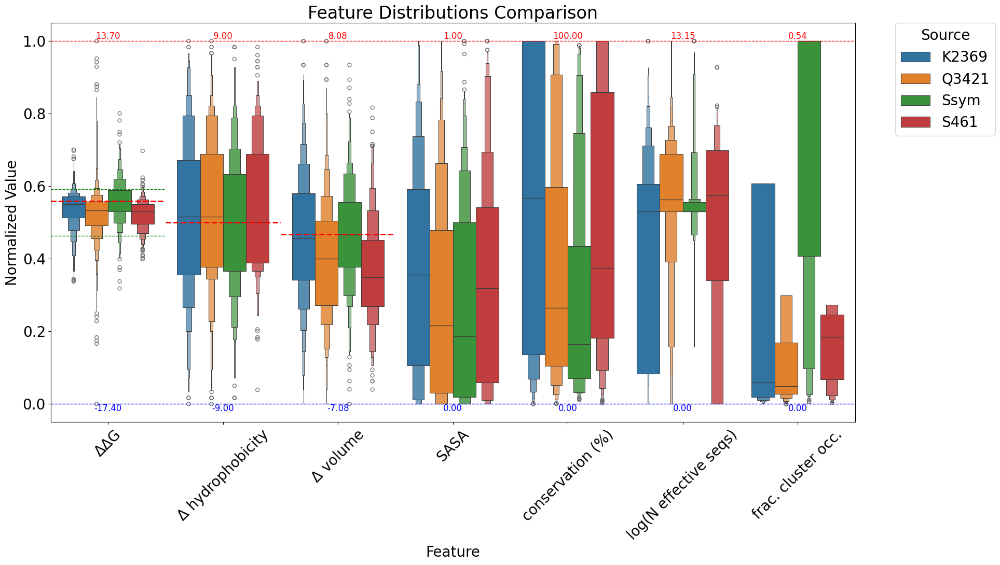

In [ ]:
import importlib
importlib.reload(analysis_utils)

db = pd.read_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv'))
s461_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))
ssym_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))
ssym_feats = ssym_feats.rename({'delta_kdh':'delta_kdh_dir', 'delta_vol':'delta_vol_dir', 'rel_ASA':'rel_ASA_dir'}, axis=1)
korpm_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 'korpm_analysis.csv'))

#compare_distributions_violin(db_feats_2.drop(['n_seqs', 'on_interface', 'column_completeness', 'saltbrs'], axis=1).join(db_ddg), s461_feats, shared_columns=['delta_kdh', 'delta_vol', 'rel_ASA', 'conservation', 'ddG'])
analysis_utils.compare_distributions_boxes([korpm_feats,db,ssym_feats,s461_feats], shared_columns=['ddG', 'delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'log_neff'], sources=['K2369', 'Q3421', 'Ssym', 'S461'])
#analysis_utils.compare_distributions_violin(db, korpm_feats, shared_columns=['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'log_neff', 'ddG'], source1='Q3421', label_adjust=0.25)

### Figure 5 (Methods)

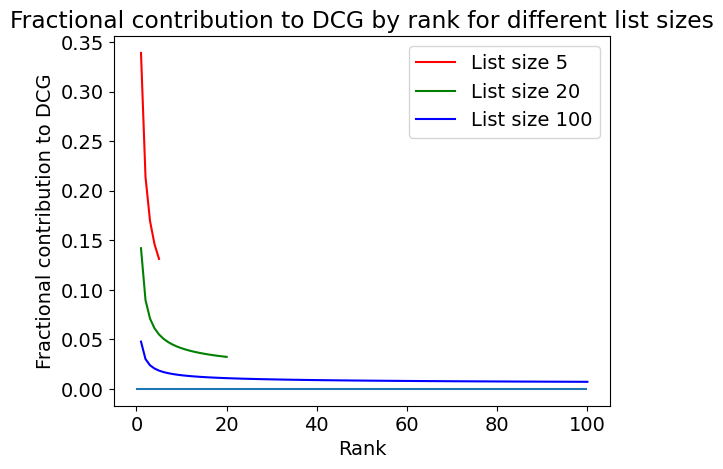

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def fractional_contributions(list_size, base=2):
    ranks = np.arange(1, list_size+1)
    discounts = 1 / np.log2(ranks + 1)  # compute the discount for each rank
    return discounts / np.sum(discounts)  # normalize to get fractional contributions

list_sizes = [5, 20, 100]
colors = ['r', 'g', 'b']

for i, list_size in enumerate(list_sizes):
    fractions = fractional_contributions(list_size)
    plt.plot(np.arange(1, list_size+1), fractions, color=colors[i], label=f'List size {list_size}')

plt.xlabel('Rank')
plt.ylabel('Fractional contribution to DCG')
plt.title('Fractional contribution to DCG by rank for different list sizes')
plt.hlines(0, 0, 100)
plt.legend()
plt.show()